## Environment set up and import Libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
with tf.device(device_name):
  print(device_name.split(":")[1]," running . . . ")

GPU  running . . . 


In [3]:
import tensorflow as tf
import os,sys
import numpy as np
import random

random.seed(1)
np.random.seed(1)
tf.random.set_seed(2)

In [4]:
import os, keras, numpy,tensorflow
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from numpy import *
from numpy.random import *
from keras.datasets.fashion_mnist import load_data
from keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from keras.models import Model
from keras.layers import *
from tensorflow.keras import initializers

## **Discriminator** Model

In [44]:
def define_discriminator(in_shape=(128,128,3),n_classes=7):

    # input level
    label_layer_1 = Input(shape=(1,), name = "Input_Label")
    label_layer_2 = Embedding(n_classes, 100, name="Embedding_Layer")(label_layer_1)
    label_layer_3 = Dense(in_shape[0] * in_shape[1], name="Dense_Layer_1")(label_layer_2)
    label_layer_4 = Reshape((in_shape[0], in_shape[1], 1), name="Reshape_Layer_1")(label_layer_3)
    # (128, 128, 1)

    # input image
    input_image = Input(shape=in_shape, name = "Input_Image")
    # (128, 128, 3)

    concat_layer = Concatenate(name = "Concatenation_Layer")([input_image, label_layer_4])
    # (128, 128, 4)

    conv2d_layer_1 = Conv2D(filters = 16, kernel_size = (3,3), strides = (2,2), padding='same', name="Convolution_Layer_1")(concat_layer)
    conv2d_layer_1 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_1")(conv2d_layer_1)
    # (64, 64, 16)

    conv2d_layer_2 = Conv2D(filters = 32, kernel_size = (3,3), strides = (2,2), padding = 'same', name="Convolution_Layer_2")(conv2d_layer_1)
    conv2d_layer_2 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_2")(conv2d_layer_2)
    # (32, 32, 32)

    conv2d_layer_3 = Conv2D(filters = 64, kernel_size = (3,3),  strides = (2,2), padding = 'same', name="Convolution_Layer_3")(conv2d_layer_2)
    conv2d_layer_3 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_3")(conv2d_layer_3)
    # (16, 16, 64)

    conv2d_layer_4 = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), padding = 'same', name="Convolution_Layer_4")(conv2d_layer_3)
    conv2d_layer_4 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_4")(conv2d_layer_4)
    # (8, 8, 64)

    conv2d_layer_5 = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), padding = 'same', name="Convolution_Layer_5")(conv2d_layer_4)
    conv2d_layer_5 = LeakyReLU(alpha=0.3, name="LeakyReLU_Layer_5")(conv2d_layer_5)
    # (8, 8, 64)

    flatten_layer = Flatten(name="Flatten_Layer")(conv2d_layer_5)
    # (4 * 4 * 64)

    dropout_layer = Dropout(rate=0.4, name="Dropout_Layer")(flatten_layer)
    # (4 * 4 * 64)

    dense_layer = Dense(128*8, activation='relu', name="Dense_Layer_2")(dropout_layer)
    # (8 * 128)

    # final layer
    output_layer = Dense(1, activation='linear', name="Dense_Layer_3")(dense_layer)
    # (1,)

    model = Model([input_image,label_layer_1], output_layer)

    opt = Adam(learning_rate= 3e-4, beta_1=0.5)
    model.compile(loss='mse', optimizer=opt, metrics=['accuracy'])
    return model

a = define_discriminator()
a.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Embedding_Layer (Embedding)    (None, 1, 100)       700         ['Input_Label[0][0]']            
                                                                                                  
 Dense_Layer_1 (Dense)          (None, 1, 16384)     1654784     ['Embedding_Layer[0][0]']        
                                                                                                  
 Input_Image (InputLayer)       [(None, 128, 128, 3  0           []                               
                                )]                                                         

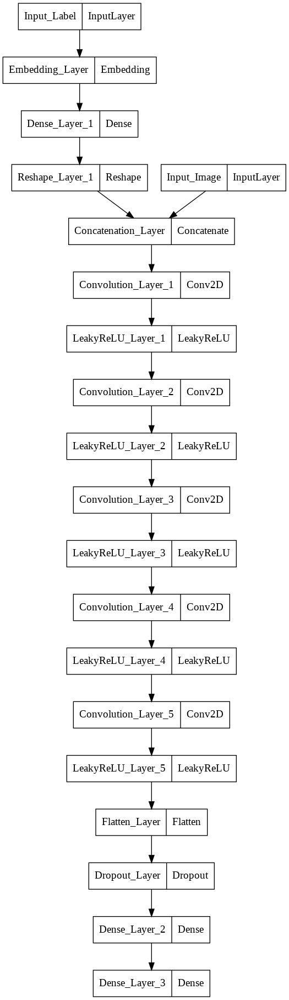

In [45]:
# plot the discriminator model
tf.keras.utils.plot_model(a)

## **Generator** Model

In [46]:
def define_generator(latent_dim = 100, n_classes = 7):

    # input level
    label_layer_1 = Input(shape=(1,), name = "Input_Label")
    label_layer_2 = Embedding(n_classes, 100, name="Embedding_Layer")(label_layer_1)
    label_layer_3 = Dense(8 * 8, name="Dense_Layer_1")(label_layer_2)
    label_layer_4 = Reshape((8, 8, 1), name="Reshape_Layer_1")(label_layer_3)
    # (8, 8, 1)

    # latent input
    latent_layer = Input(shape=(latent_dim,), name = "Input_Latent")

    layer_2 = Dense(128 * 8 * 8,activation="relu", name="Dense_Layer_2")(latent_layer)
    # layer_2 = Activation("relu")(layer_2)
    layer_2 = Reshape((8, 8, 128), name="Reshape_Layer_2")(layer_2)
    layer_2_1 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_1")(layer_2)
    # (8, 8, 128)


    concat_layer_1 = Concatenate(name="Concatenation_Layer")([layer_2_1, label_layer_4])
    # (8, 8, 129)

    layer_3 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_1")(concat_layer_1)
    layer_3 = Conv2D(filters = 128, kernel_size = (3,3), padding='same', kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_1")(layer_3)
    layer_3 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_2")(layer_3)
    layer_3 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_1")(layer_3)
    # (16, 16, 128)

    layer_4 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_2")(layer_3)
    layer_4 = Conv2D(filters = 128, kernel_size = (3,3), padding='same',kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_2")(layer_4)
    layer_4 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_3")(layer_4)
    layer_4 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_2")(layer_4)
    # (32, 32, 128)

    layer_5 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_3")(layer_4)
    layer_5 = Conv2D(filters = 128, kernel_size = (3,3), padding='same',kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_3")(layer_5)
    layer_5 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_4")(layer_5)
    layer_5 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_3")(layer_5)
    # (64, 64, 128)

    layer_6 = Conv2DTranspose(filters = 128, kernel_size = (3,3), strides=(2,2), padding='same', name="Convolution_Transpose_Layer_4")(layer_5)
    layer_6 = Conv2D(filters = 128, kernel_size = (3,3), padding='same',kernel_initializer = initializers.RandomNormal(0,0.8), name="Convolution_Layer_4")(layer_6)
    layer_6 = BatchNormalization(momentum = 0.8, name="Batchnormalization_Layer_5")(layer_6)
    layer_6 = LeakyReLU(alpha=0.4, name="LeakyReLU_Layer_4")(layer_6)
    # (128, 128, 256)

    # final layer
    output_layer = Conv2D(filters = 3, kernel_size = (3,3), strides=(1,1), activation='tanh', padding='same', name="Convolution_Layer_5")(layer_6)

    model = Model([latent_layer,label_layer_1], output_layer)
    return model

b = define_generator(512)
b.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Latent (InputLayer)      [(None, 512)]        0           []                               
                                                                                                  
 Input_Label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Dense_Layer_2 (Dense)          (None, 8192)         4202496     ['Input_Latent[0][0]']           
                                                                                                  
 Embedding_Layer (Embedding)    (None, 1, 100)       700         ['Input_Label[0][0]']            
                                                                                           

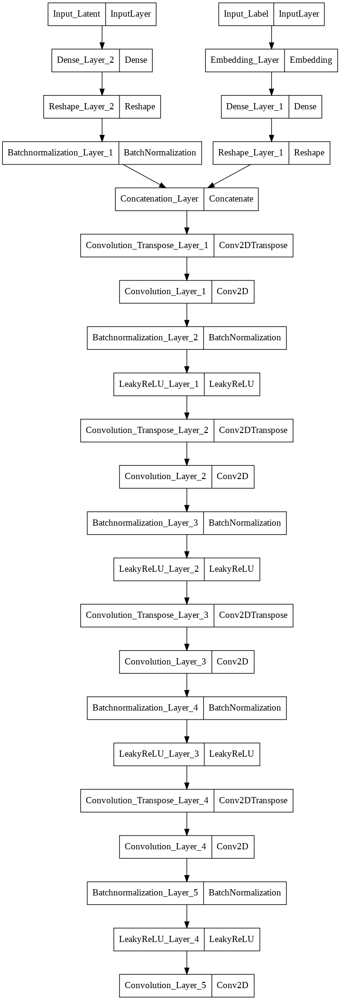

In [47]:
# plot the generator model
tf.keras.utils.plot_model(b)

## **Combine** or **GAN** Model

In [48]:
def define_gan(g_model, d_model):

  d_model.trainable = False

  g_latent, g_label = g_model.input
  g_output = g_model.output

  d_output = d_model([g_output,g_label])

  model = Model([g_latent, g_label], d_output)

  opt = Adam(learning_rate= 3e-4, beta_1=0.5)
  model.compile(loss='mse', optimizer=opt,  metrics=['accuracy'])
  
  return model
c = define_gan(b, a)
c.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Latent (InputLayer)      [(None, 512)]        0           []                               
                                                                                                  
 Input_Label (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 Dense_Layer_2 (Dense)          (None, 8192)         4202496     ['Input_Latent[0][0]']           
                                                                                                  
 Embedding_Layer (Embedding)    (None, 1, 100)       700         ['Input_Label[0][0]']            
                                                                                           

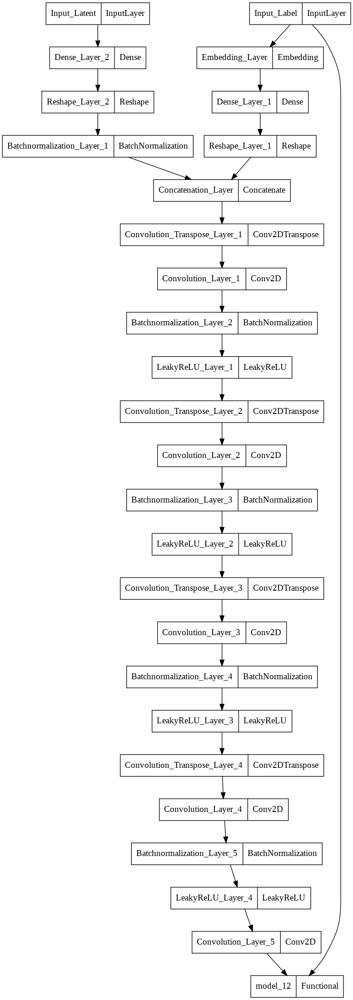

In [49]:
# plot GAN model
tf.keras.utils.plot_model(c)

## Load Dataset

In [50]:
def load_real_samples():
  # load dataset
  data = np.load("/content/drive/MyDrive/GAN_New_Approch/1/celeb_dataset_128.npz")
  data = data['arr_0']
  data = np.array(data)
  X = data.astype('float32')
  # scale from [0,255] to [-1,1]
  X = (X - 127.5) / 127.5
  return X
# k = load_real_samples()
# print("image: ",k.shape)
# print("\nshape/size of the first 16 data: ",k[:16].shape)

## Plot data with label

## Plot data with label

In [14]:
def save_plot(x_input,n=4):
    # x_input = (x_input + 1)/2.0
    for i in range(n*n):
        plt.subplot(n, n, i+1)
        plt.imshow(x_input[i,:,:,:])
        plt.axis('off')
    plt.show()
# plot data
# save_plot(k[:16])

## Generate real sample function

In [15]:
def generate_real_samples(dataset, n_samples):
	images = dataset
	ix = randint(0, images.shape[0], n_samples)
	X = images[ix]
	z = np.random.randint(0,7,size=(n_samples))
	y = ones((n_samples, 1))
	return [X,z], y
# d = generate_real_samples(k, 32)
# print("Generate real data as a batch randomly: ",d[0][0].shape)

## Generate latent point function

In [16]:
def generate_latent_points(latent_dim, n_samples):
  x_input = randn(latent_dim * n_samples)
  z_input = x_input.reshape(n_samples, latent_dim)
  z = np.random.randint(0,7,size=(n_samples))
  return [z_input,z]
# p = generate_latent_points(512, 32)
# print("Generate latent point(with label) as a batch: ",p[0].shape)

## Generate Fake samples of image with label

In [54]:
def generate_fake_samples(generator, latent_dim, n_samples):
	z_input,z = generate_latent_points(latent_dim, n_samples)
	images = generator.predict([z_input,z])
	y = zeros((n_samples, 1))
	return [images, z], y
# with tf.device(device_name):
	# kh = generate_fake_samples(b, 512, 32)
	# print("shape of the generated images: ",kh[0][0].shape)

## Summarize the generator model

In [55]:
def summarize_the_model(generator,latent_dim = 100):
    latent_points = generate_latent_points(latent_dim= latent_dim, n_samples= 16)
    X  = generator.predict(latent_points)
    # scale from [-1,1] to [0,1]
    X = (X + 1) / 2.0
    save_plot(X, n=4)

In [56]:
# def save_figure(generator,a,latent_dim = 512,n=4):
#     latent_points, labels = generate_latent_points(latent_dim= latent_dim, n_samples= 16)
#     X  = generator.predict([latent_points, labels])
#     # plt.title("Epoch_"+str(a+1),loc = "center")
#     for j in range(n*n):
#         plt.subplot(n, n, j+1)
#         plt.imshow(X[j,:,:,:])
#         plt.axis('off')
#     plt.suptitle("Epoch_"+str(a+1))
#     plt.savefig("/content/drive/MyDrive/GAN_New_Approch/1/epoch_"+str(a+1))

## Train function

In [57]:
def train(g_model, d_model, gan_model, dataset, latent_dim= 100, n_epochs=3, n_batch=128):

  print("No. of epoch: ",n_epochs)
  bat_per_epo = int(dataset.shape[0] / n_batch)
  print("batch per epoch: ", bat_per_epo)
  print("full batch: ",n_batch)
  half_batch = int(n_batch / 2)
  print("half batch: ", half_batch,'\n')
  print("*"*50,'\n\n')

  d_loss_real_array,d_loss_fake_array =[],[]
  g_loss_array = []
  for i in range(n_epochs):
    d_loss_r,d_loss_f = 0.0,0.0
    g_loss = 0.0
    
    for j in range(bat_per_epo):

      [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
      d_loss1, _ = d_model.train_on_batch([X_real, labels_real], y_real)
      d_loss_r += d_loss1
      # print("real_loss")

      [X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
      d_loss2, _ = d_model.train_on_batch([X_fake, labels], y_fake)
      d_loss_f += d_loss2
      # print("fake_loss")

      [z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
      y_gan = ones((n_batch, 1))
      g_loss1,_ = gan_model.train_on_batch([z_input, labels_input], y_gan)
      g_loss += g_loss1

    d_loss_real_array.append(d_loss_r)
    d_loss_fake_array.append(d_loss_f)
    g_loss_array.append(g_loss)

    print('epoch -> [%d/%d], discriminator_loss_for_real_data = %.2f, discriminator_loss_for_fake_data = %.2f, generator_loss = %.2f\n' %(i+1, n_epochs, d_loss_r, d_loss_f, g_loss))
    summarize_the_model(g_model,latent_dim)
    # g_model.save("g_gan_model_"+str(i)+".h5")
    g_model.save("/content/drive/MyDrive/GAN_New_Approch/1/generator_model_2.h5")
    np.savez_compressed('/content/drive/MyDrive/GAN_New_Approch/1/loss_record_2.npz', a=d_loss_real_array, b=d_loss_fake_array, c=g_loss_array)
    # save_figure(g_model,i,latent_dim = 512,n=4)

    print("\n")

  return d_loss_real_array, d_loss_fake_array, g_loss_array

## Main function


READY TO GO !!!

No. of epoch:  160
batch per epoch:  312
full batch:  32
half batch:  16 

************************************************** 


epoch -> [1/160], discriminator_loss_for_real_data = 61.85, discriminator_loss_for_fake_data = 43.83, generator_loss = 240.18



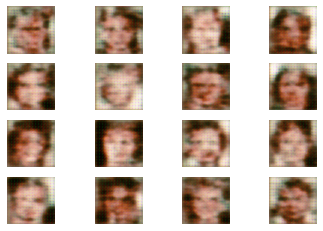



epoch -> [2/160], discriminator_loss_for_real_data = 79.59, discriminator_loss_for_fake_data = 70.72, generator_loss = 126.86



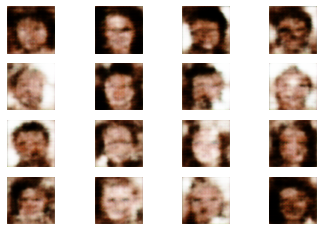



epoch -> [3/160], discriminator_loss_for_real_data = 69.11, discriminator_loss_for_fake_data = 60.37, generator_loss = 172.12



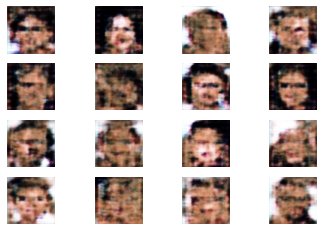



epoch -> [4/160], discriminator_loss_for_real_data = 75.43, discriminator_loss_for_fake_data = 69.03, generator_loss = 143.63



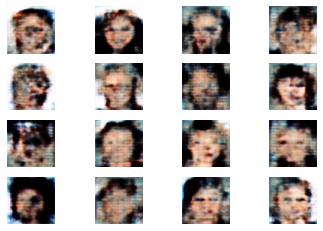



epoch -> [5/160], discriminator_loss_for_real_data = 77.38, discriminator_loss_for_fake_data = 70.20, generator_loss = 115.73



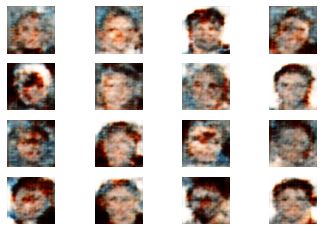



epoch -> [6/160], discriminator_loss_for_real_data = 75.55, discriminator_loss_for_fake_data = 67.56, generator_loss = 131.54



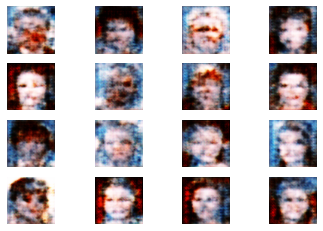



epoch -> [7/160], discriminator_loss_for_real_data = 74.51, discriminator_loss_for_fake_data = 64.60, generator_loss = 131.75



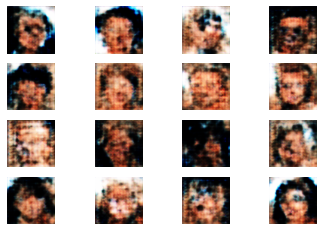



epoch -> [8/160], discriminator_loss_for_real_data = 75.88, discriminator_loss_for_fake_data = 64.90, generator_loss = 125.93



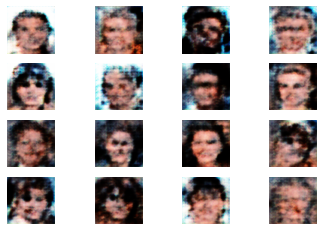



epoch -> [9/160], discriminator_loss_for_real_data = 77.22, discriminator_loss_for_fake_data = 64.93, generator_loss = 121.63



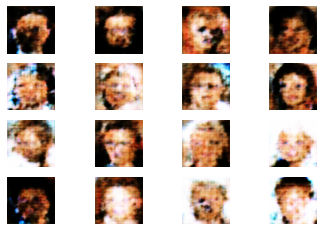



epoch -> [10/160], discriminator_loss_for_real_data = 72.35, discriminator_loss_for_fake_data = 62.06, generator_loss = 131.82



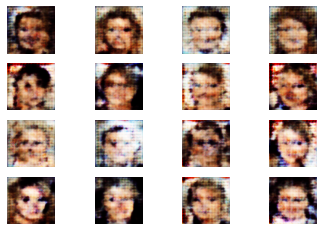



epoch -> [11/160], discriminator_loss_for_real_data = 75.97, discriminator_loss_for_fake_data = 66.96, generator_loss = 120.47



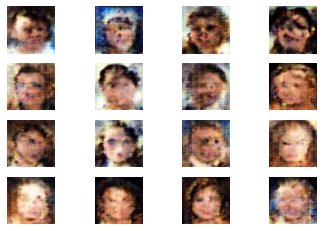



epoch -> [12/160], discriminator_loss_for_real_data = 75.61, discriminator_loss_for_fake_data = 68.35, generator_loss = 116.61



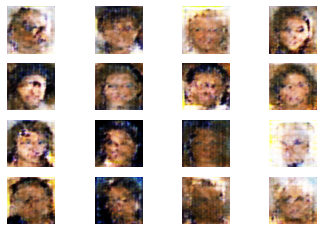



epoch -> [13/160], discriminator_loss_for_real_data = 77.22, discriminator_loss_for_fake_data = 69.50, generator_loss = 111.60



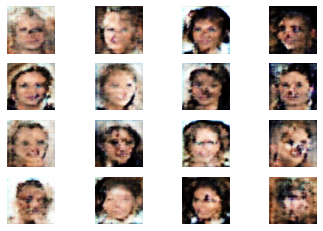



epoch -> [14/160], discriminator_loss_for_real_data = 74.35, discriminator_loss_for_fake_data = 67.32, generator_loss = 114.63



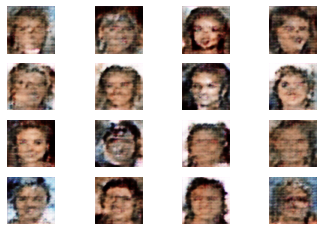



epoch -> [15/160], discriminator_loss_for_real_data = 70.78, discriminator_loss_for_fake_data = 65.40, generator_loss = 125.32



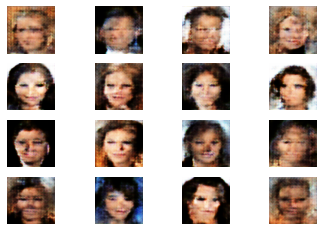



epoch -> [16/160], discriminator_loss_for_real_data = 71.28, discriminator_loss_for_fake_data = 65.80, generator_loss = 124.41



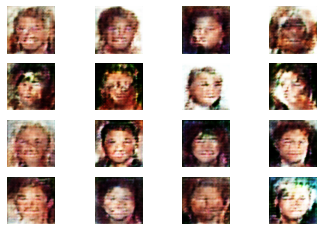



epoch -> [17/160], discriminator_loss_for_real_data = 69.39, discriminator_loss_for_fake_data = 62.03, generator_loss = 132.97



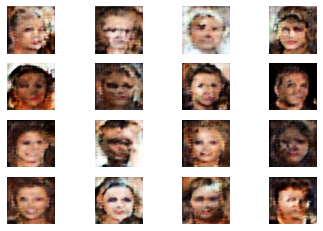



epoch -> [18/160], discriminator_loss_for_real_data = 67.74, discriminator_loss_for_fake_data = 60.04, generator_loss = 138.40



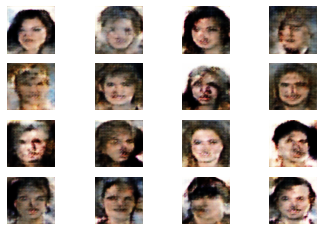



epoch -> [19/160], discriminator_loss_for_real_data = 71.85, discriminator_loss_for_fake_data = 64.56, generator_loss = 126.26



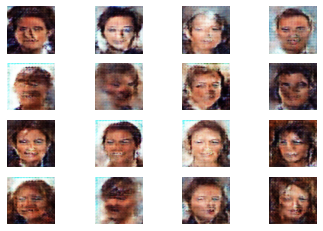



epoch -> [20/160], discriminator_loss_for_real_data = 69.07, discriminator_loss_for_fake_data = 63.57, generator_loss = 135.16



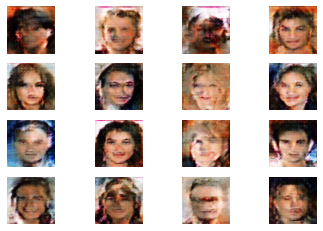



epoch -> [21/160], discriminator_loss_for_real_data = 70.66, discriminator_loss_for_fake_data = 63.01, generator_loss = 128.72



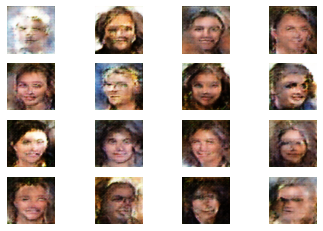



epoch -> [22/160], discriminator_loss_for_real_data = 69.58, discriminator_loss_for_fake_data = 61.63, generator_loss = 129.60



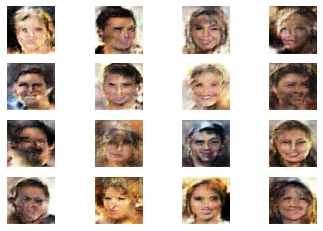



epoch -> [23/160], discriminator_loss_for_real_data = 69.47, discriminator_loss_for_fake_data = 61.06, generator_loss = 131.31



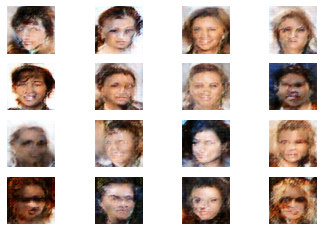



epoch -> [24/160], discriminator_loss_for_real_data = 66.68, discriminator_loss_for_fake_data = 59.41, generator_loss = 135.63



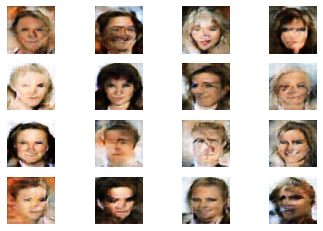



epoch -> [25/160], discriminator_loss_for_real_data = 66.09, discriminator_loss_for_fake_data = 57.51, generator_loss = 142.20



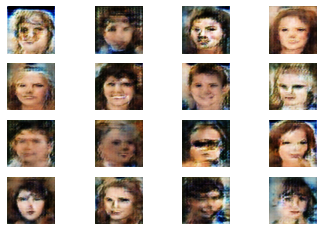



epoch -> [26/160], discriminator_loss_for_real_data = 66.27, discriminator_loss_for_fake_data = 56.85, generator_loss = 142.29



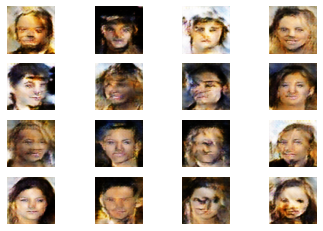



epoch -> [27/160], discriminator_loss_for_real_data = 66.79, discriminator_loss_for_fake_data = 57.41, generator_loss = 139.56



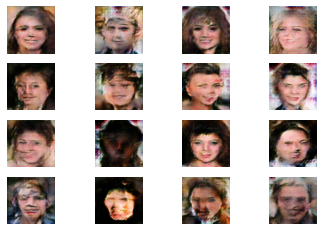



epoch -> [28/160], discriminator_loss_for_real_data = 66.96, discriminator_loss_for_fake_data = 57.03, generator_loss = 138.82



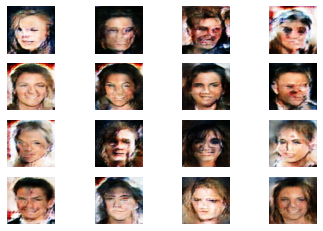



epoch -> [29/160], discriminator_loss_for_real_data = 65.40, discriminator_loss_for_fake_data = 56.23, generator_loss = 144.13



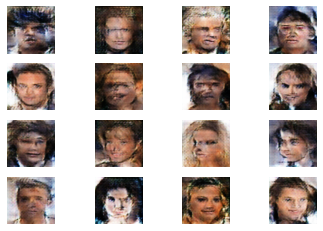



epoch -> [30/160], discriminator_loss_for_real_data = 64.54, discriminator_loss_for_fake_data = 54.09, generator_loss = 144.44



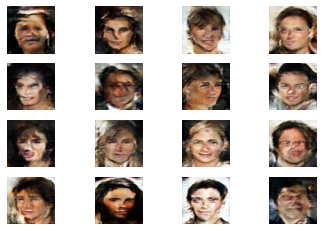



epoch -> [31/160], discriminator_loss_for_real_data = 64.98, discriminator_loss_for_fake_data = 55.61, generator_loss = 142.81



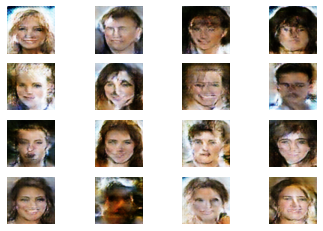



epoch -> [32/160], discriminator_loss_for_real_data = 65.14, discriminator_loss_for_fake_data = 55.89, generator_loss = 143.26



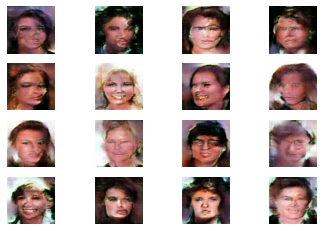



epoch -> [33/160], discriminator_loss_for_real_data = 63.84, discriminator_loss_for_fake_data = 55.24, generator_loss = 145.53



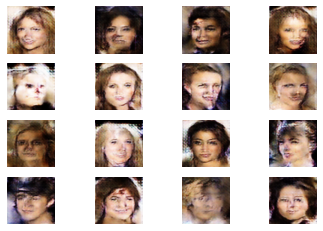



epoch -> [34/160], discriminator_loss_for_real_data = 62.69, discriminator_loss_for_fake_data = 54.85, generator_loss = 144.76



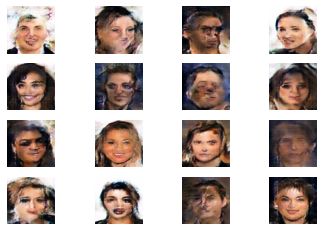



epoch -> [35/160], discriminator_loss_for_real_data = 65.38, discriminator_loss_for_fake_data = 54.99, generator_loss = 144.91



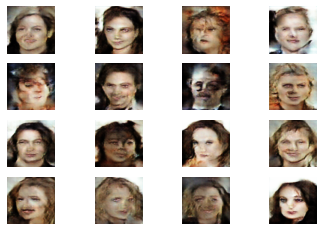



epoch -> [36/160], discriminator_loss_for_real_data = 63.04, discriminator_loss_for_fake_data = 52.41, generator_loss = 150.65



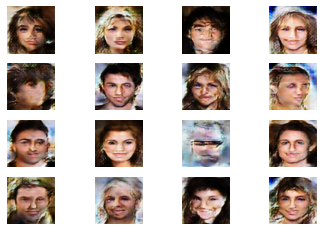



epoch -> [37/160], discriminator_loss_for_real_data = 60.53, discriminator_loss_for_fake_data = 51.64, generator_loss = 154.61



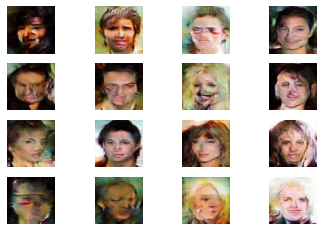



epoch -> [38/160], discriminator_loss_for_real_data = 61.48, discriminator_loss_for_fake_data = 52.33, generator_loss = 151.63



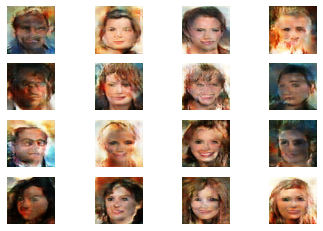



epoch -> [39/160], discriminator_loss_for_real_data = 60.60, discriminator_loss_for_fake_data = 51.14, generator_loss = 154.46



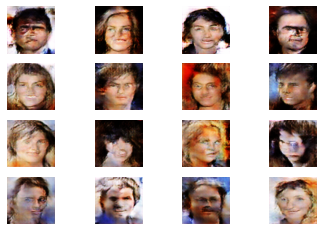



epoch -> [40/160], discriminator_loss_for_real_data = 62.00, discriminator_loss_for_fake_data = 51.89, generator_loss = 152.22



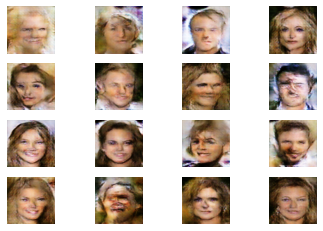



epoch -> [41/160], discriminator_loss_for_real_data = 59.03, discriminator_loss_for_fake_data = 49.25, generator_loss = 157.97



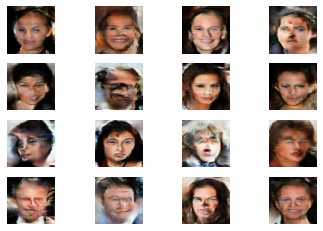



epoch -> [42/160], discriminator_loss_for_real_data = 58.71, discriminator_loss_for_fake_data = 47.92, generator_loss = 159.78



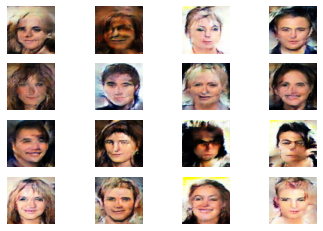



epoch -> [43/160], discriminator_loss_for_real_data = 59.17, discriminator_loss_for_fake_data = 48.30, generator_loss = 160.07



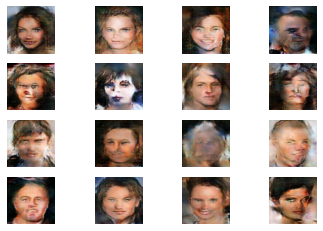



epoch -> [44/160], discriminator_loss_for_real_data = 59.31, discriminator_loss_for_fake_data = 48.77, generator_loss = 159.55



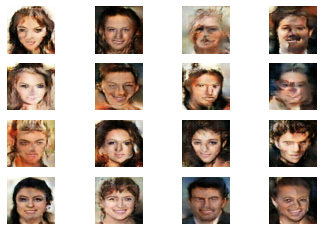



epoch -> [45/160], discriminator_loss_for_real_data = 57.34, discriminator_loss_for_fake_data = 48.07, generator_loss = 160.99



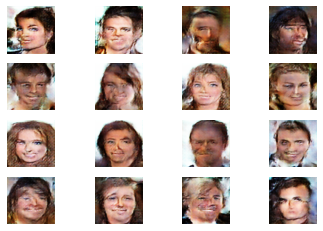



epoch -> [46/160], discriminator_loss_for_real_data = 57.71, discriminator_loss_for_fake_data = 46.46, generator_loss = 162.60



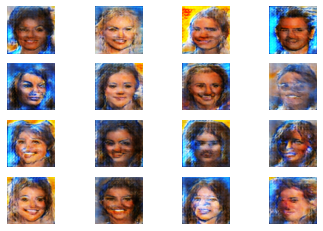



epoch -> [47/160], discriminator_loss_for_real_data = 54.20, discriminator_loss_for_fake_data = 43.99, generator_loss = 171.78



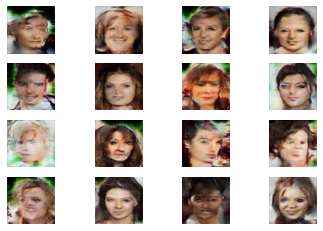



epoch -> [48/160], discriminator_loss_for_real_data = 56.45, discriminator_loss_for_fake_data = 46.49, generator_loss = 166.11



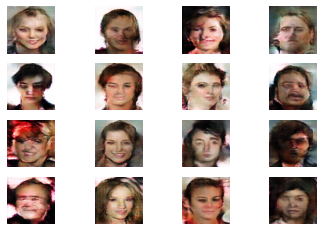



epoch -> [49/160], discriminator_loss_for_real_data = 57.26, discriminator_loss_for_fake_data = 45.17, generator_loss = 169.42



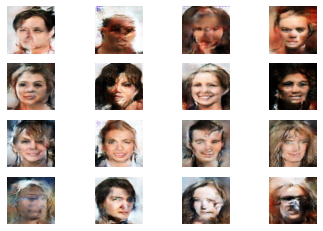



epoch -> [50/160], discriminator_loss_for_real_data = 54.77, discriminator_loss_for_fake_data = 44.84, generator_loss = 170.82



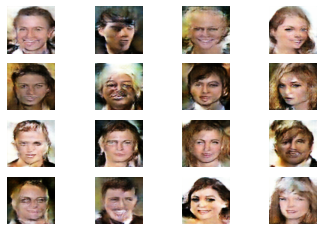



epoch -> [51/160], discriminator_loss_for_real_data = 54.94, discriminator_loss_for_fake_data = 44.98, generator_loss = 171.99



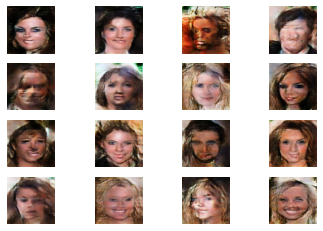



epoch -> [52/160], discriminator_loss_for_real_data = 55.73, discriminator_loss_for_fake_data = 44.73, generator_loss = 171.16



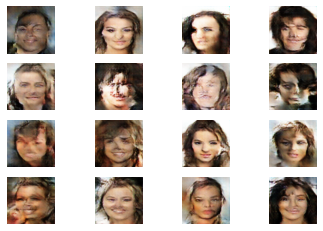



epoch -> [53/160], discriminator_loss_for_real_data = 54.26, discriminator_loss_for_fake_data = 44.86, generator_loss = 169.29



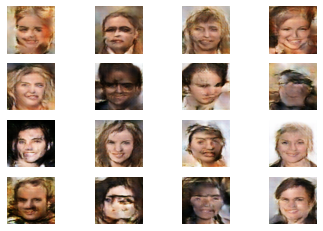



epoch -> [54/160], discriminator_loss_for_real_data = 53.24, discriminator_loss_for_fake_data = 42.79, generator_loss = 177.06



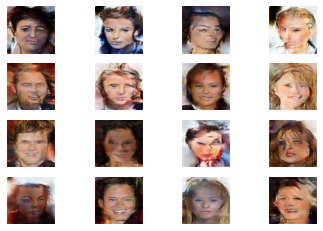



epoch -> [55/160], discriminator_loss_for_real_data = 53.37, discriminator_loss_for_fake_data = 42.50, generator_loss = 175.38



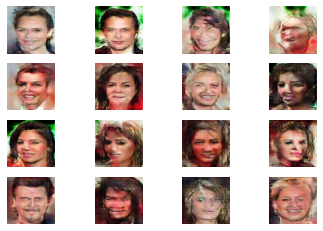



epoch -> [56/160], discriminator_loss_for_real_data = 53.43, discriminator_loss_for_fake_data = 43.11, generator_loss = 176.56



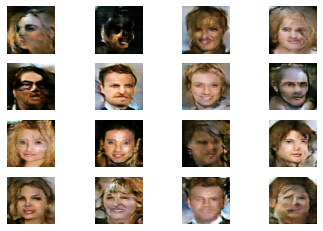



epoch -> [57/160], discriminator_loss_for_real_data = 53.48, discriminator_loss_for_fake_data = 43.27, generator_loss = 172.73



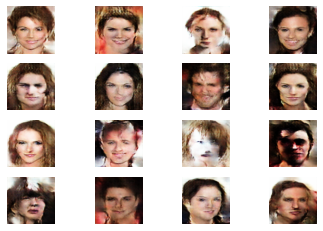



epoch -> [58/160], discriminator_loss_for_real_data = 52.65, discriminator_loss_for_fake_data = 42.50, generator_loss = 176.37



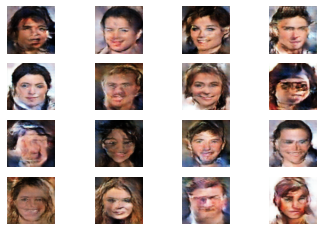



epoch -> [59/160], discriminator_loss_for_real_data = 52.37, discriminator_loss_for_fake_data = 42.32, generator_loss = 177.67



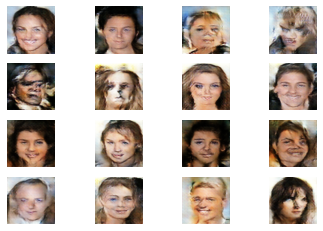



epoch -> [60/160], discriminator_loss_for_real_data = 52.45, discriminator_loss_for_fake_data = 42.61, generator_loss = 179.10



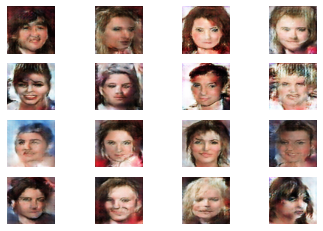



epoch -> [61/160], discriminator_loss_for_real_data = 51.26, discriminator_loss_for_fake_data = 41.80, generator_loss = 179.50



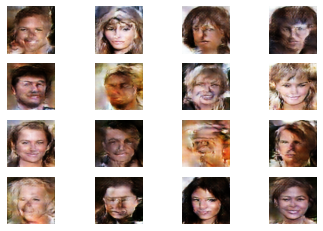



epoch -> [62/160], discriminator_loss_for_real_data = 50.54, discriminator_loss_for_fake_data = 42.03, generator_loss = 178.44



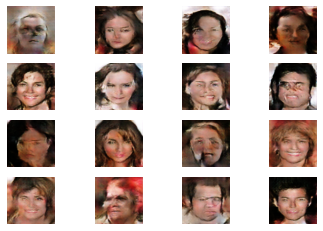



epoch -> [63/160], discriminator_loss_for_real_data = 50.53, discriminator_loss_for_fake_data = 39.61, generator_loss = 185.52



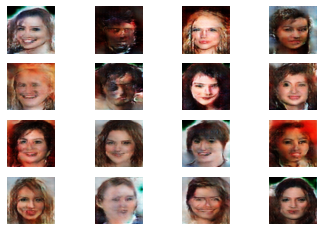



epoch -> [64/160], discriminator_loss_for_real_data = 49.23, discriminator_loss_for_fake_data = 38.62, generator_loss = 188.66



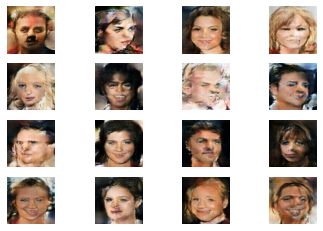



epoch -> [65/160], discriminator_loss_for_real_data = 48.30, discriminator_loss_for_fake_data = 38.60, generator_loss = 186.29



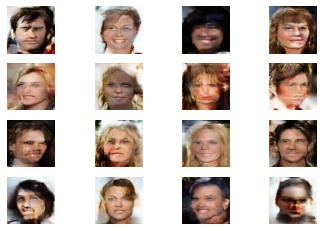



epoch -> [66/160], discriminator_loss_for_real_data = 48.06, discriminator_loss_for_fake_data = 37.84, generator_loss = 189.60



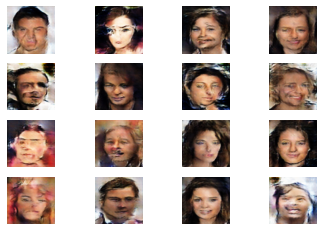



epoch -> [67/160], discriminator_loss_for_real_data = 47.76, discriminator_loss_for_fake_data = 37.80, generator_loss = 190.76



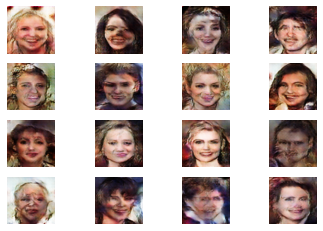



epoch -> [68/160], discriminator_loss_for_real_data = 47.26, discriminator_loss_for_fake_data = 37.79, generator_loss = 188.85



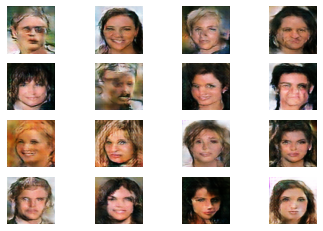



epoch -> [69/160], discriminator_loss_for_real_data = 48.96, discriminator_loss_for_fake_data = 39.55, generator_loss = 187.51



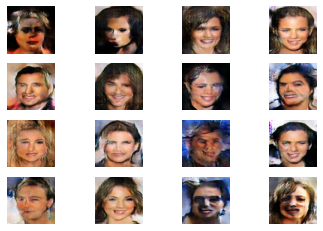



epoch -> [70/160], discriminator_loss_for_real_data = 47.71, discriminator_loss_for_fake_data = 38.91, generator_loss = 191.37



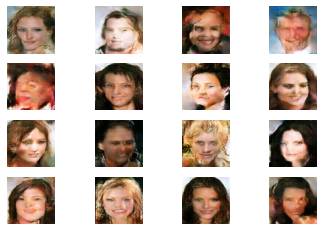



epoch -> [71/160], discriminator_loss_for_real_data = 47.73, discriminator_loss_for_fake_data = 37.94, generator_loss = 186.91



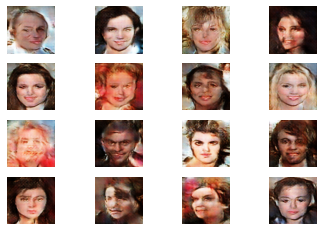



epoch -> [72/160], discriminator_loss_for_real_data = 46.68, discriminator_loss_for_fake_data = 39.02, generator_loss = 189.10



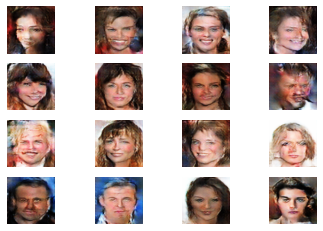



epoch -> [73/160], discriminator_loss_for_real_data = 47.65, discriminator_loss_for_fake_data = 37.03, generator_loss = 193.44



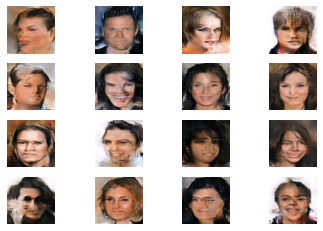



epoch -> [74/160], discriminator_loss_for_real_data = 47.34, discriminator_loss_for_fake_data = 37.95, generator_loss = 191.90



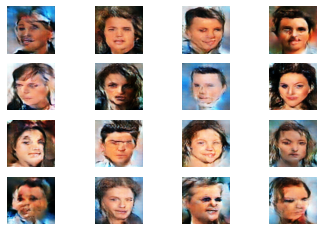



epoch -> [75/160], discriminator_loss_for_real_data = 47.23, discriminator_loss_for_fake_data = 36.99, generator_loss = 192.50



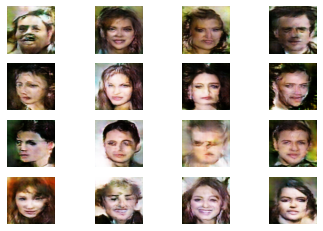



epoch -> [76/160], discriminator_loss_for_real_data = 46.91, discriminator_loss_for_fake_data = 36.47, generator_loss = 193.06



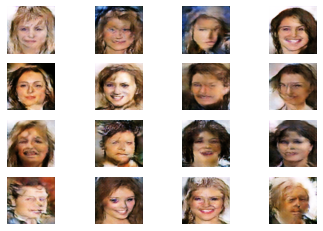



epoch -> [77/160], discriminator_loss_for_real_data = 46.34, discriminator_loss_for_fake_data = 36.50, generator_loss = 201.49



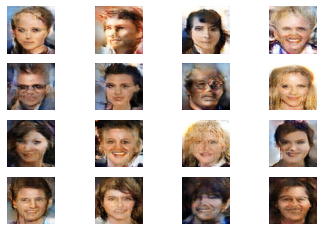



epoch -> [78/160], discriminator_loss_for_real_data = 44.72, discriminator_loss_for_fake_data = 37.48, generator_loss = 196.87



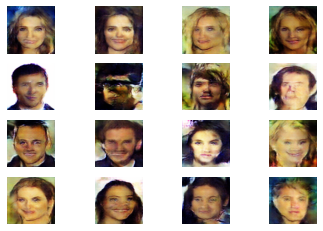



epoch -> [79/160], discriminator_loss_for_real_data = 45.82, discriminator_loss_for_fake_data = 36.98, generator_loss = 194.81



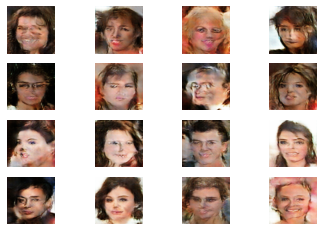



epoch -> [80/160], discriminator_loss_for_real_data = 45.22, discriminator_loss_for_fake_data = 36.65, generator_loss = 195.84



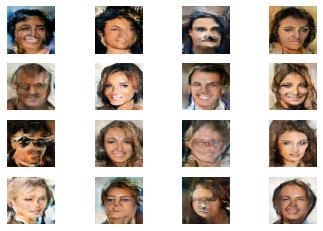



epoch -> [81/160], discriminator_loss_for_real_data = 43.86, discriminator_loss_for_fake_data = 35.83, generator_loss = 197.90



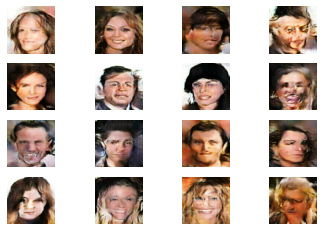



epoch -> [82/160], discriminator_loss_for_real_data = 44.63, discriminator_loss_for_fake_data = 35.78, generator_loss = 200.29



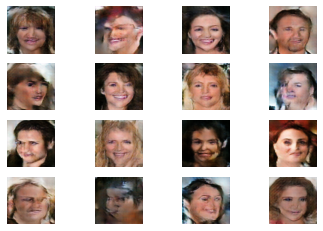



epoch -> [83/160], discriminator_loss_for_real_data = 44.52, discriminator_loss_for_fake_data = 35.90, generator_loss = 197.14



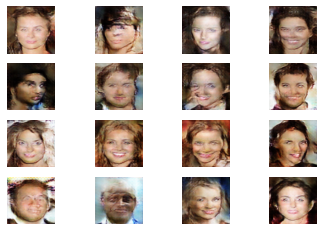



epoch -> [84/160], discriminator_loss_for_real_data = 44.18, discriminator_loss_for_fake_data = 36.10, generator_loss = 201.96



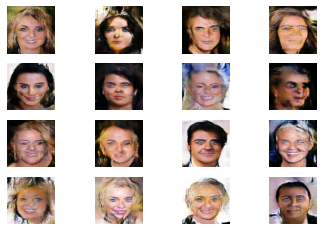



epoch -> [85/160], discriminator_loss_for_real_data = 43.55, discriminator_loss_for_fake_data = 34.52, generator_loss = 197.98



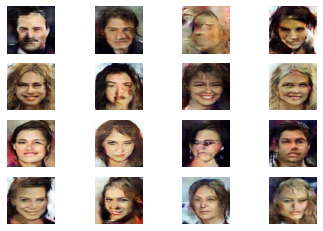



epoch -> [86/160], discriminator_loss_for_real_data = 43.48, discriminator_loss_for_fake_data = 35.63, generator_loss = 199.68



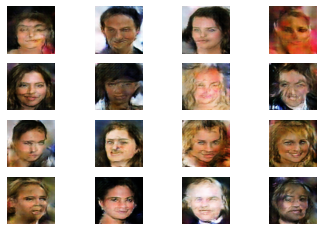



epoch -> [87/160], discriminator_loss_for_real_data = 42.86, discriminator_loss_for_fake_data = 34.20, generator_loss = 203.91



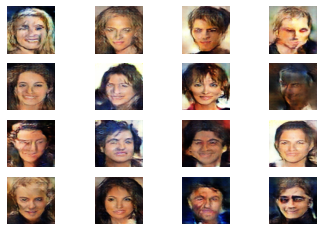



epoch -> [88/160], discriminator_loss_for_real_data = 42.93, discriminator_loss_for_fake_data = 34.75, generator_loss = 201.74



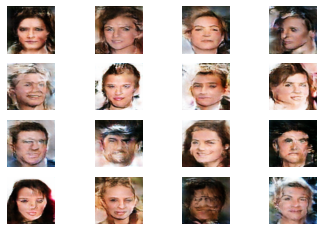



epoch -> [89/160], discriminator_loss_for_real_data = 43.84, discriminator_loss_for_fake_data = 34.11, generator_loss = 201.18



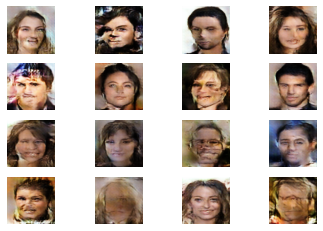



epoch -> [90/160], discriminator_loss_for_real_data = 41.89, discriminator_loss_for_fake_data = 33.25, generator_loss = 206.11



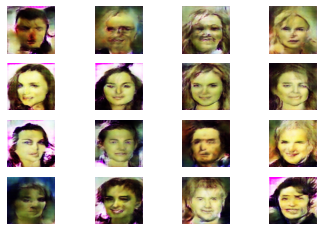



epoch -> [91/160], discriminator_loss_for_real_data = 43.00, discriminator_loss_for_fake_data = 34.29, generator_loss = 206.18



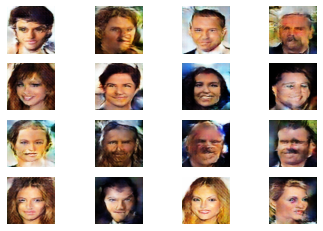



epoch -> [92/160], discriminator_loss_for_real_data = 42.45, discriminator_loss_for_fake_data = 34.94, generator_loss = 203.33



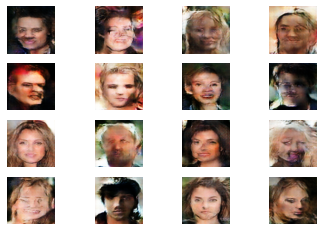



epoch -> [93/160], discriminator_loss_for_real_data = 42.02, discriminator_loss_for_fake_data = 33.36, generator_loss = 206.54



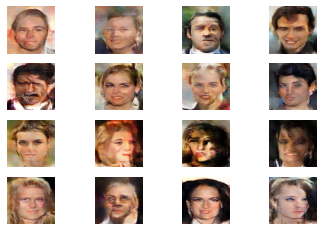



epoch -> [94/160], discriminator_loss_for_real_data = 40.66, discriminator_loss_for_fake_data = 32.35, generator_loss = 212.36



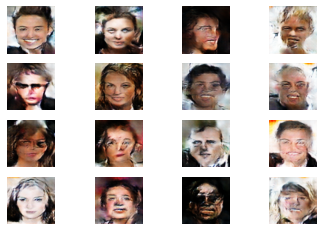



epoch -> [95/160], discriminator_loss_for_real_data = 40.90, discriminator_loss_for_fake_data = 31.64, generator_loss = 209.42



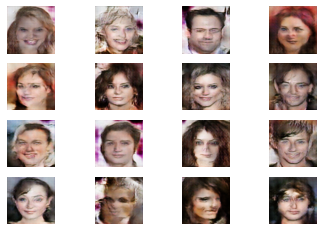



epoch -> [96/160], discriminator_loss_for_real_data = 40.88, discriminator_loss_for_fake_data = 31.44, generator_loss = 210.02



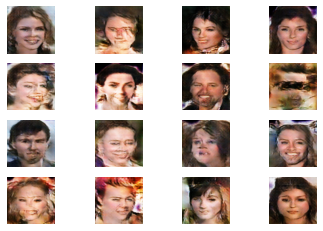



epoch -> [97/160], discriminator_loss_for_real_data = 38.99, discriminator_loss_for_fake_data = 31.75, generator_loss = 209.71



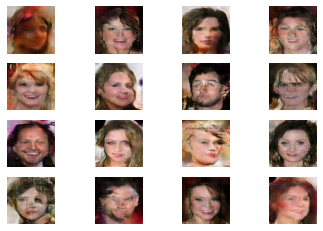



epoch -> [98/160], discriminator_loss_for_real_data = 40.00, discriminator_loss_for_fake_data = 31.34, generator_loss = 209.89



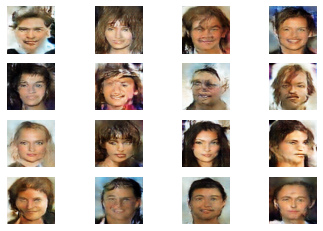



epoch -> [99/160], discriminator_loss_for_real_data = 39.88, discriminator_loss_for_fake_data = 30.99, generator_loss = 214.32



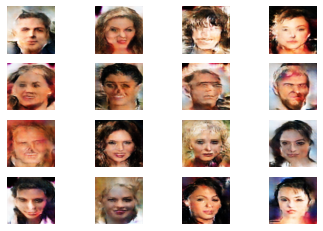



epoch -> [100/160], discriminator_loss_for_real_data = 39.09, discriminator_loss_for_fake_data = 30.46, generator_loss = 214.25



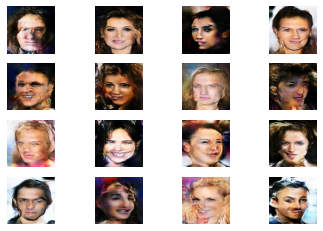



epoch -> [101/160], discriminator_loss_for_real_data = 39.49, discriminator_loss_for_fake_data = 31.83, generator_loss = 211.33



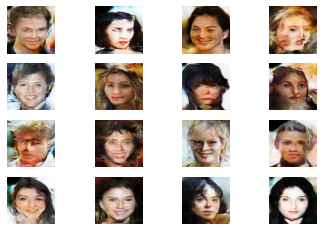



epoch -> [102/160], discriminator_loss_for_real_data = 39.81, discriminator_loss_for_fake_data = 30.41, generator_loss = 211.30



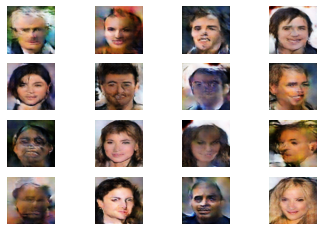



epoch -> [103/160], discriminator_loss_for_real_data = 39.21, discriminator_loss_for_fake_data = 30.57, generator_loss = 210.05



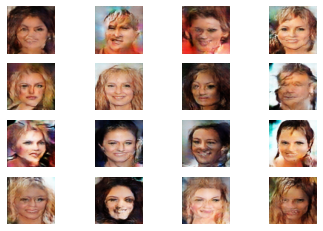



epoch -> [104/160], discriminator_loss_for_real_data = 39.58, discriminator_loss_for_fake_data = 31.59, generator_loss = 211.25



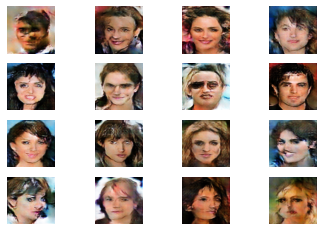



epoch -> [105/160], discriminator_loss_for_real_data = 38.89, discriminator_loss_for_fake_data = 31.38, generator_loss = 213.41



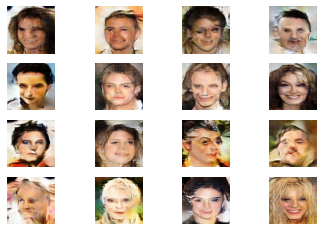



epoch -> [106/160], discriminator_loss_for_real_data = 37.84, discriminator_loss_for_fake_data = 29.48, generator_loss = 211.69



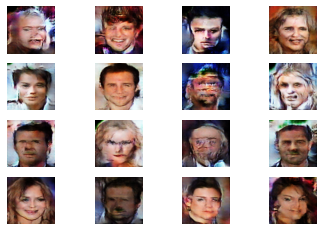



epoch -> [107/160], discriminator_loss_for_real_data = 38.94, discriminator_loss_for_fake_data = 29.18, generator_loss = 214.19



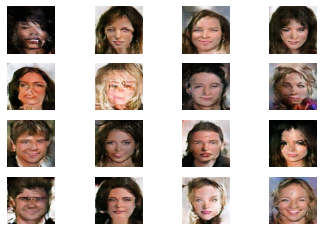



epoch -> [108/160], discriminator_loss_for_real_data = 37.73, discriminator_loss_for_fake_data = 30.27, generator_loss = 215.03



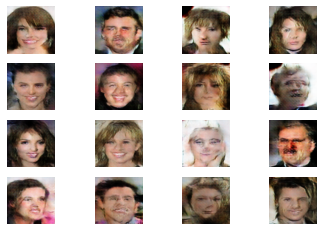



epoch -> [109/160], discriminator_loss_for_real_data = 37.97, discriminator_loss_for_fake_data = 30.33, generator_loss = 214.80



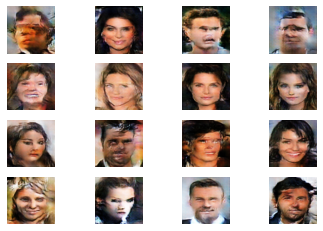



epoch -> [110/160], discriminator_loss_for_real_data = 38.60, discriminator_loss_for_fake_data = 29.23, generator_loss = 214.36



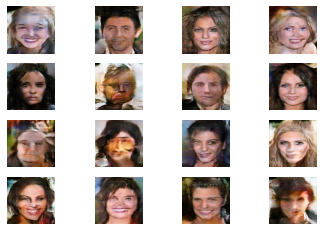



epoch -> [111/160], discriminator_loss_for_real_data = 39.00, discriminator_loss_for_fake_data = 29.53, generator_loss = 216.38



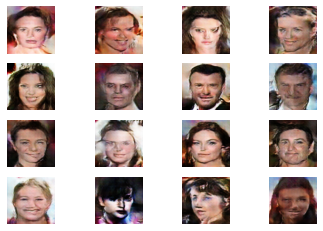



epoch -> [112/160], discriminator_loss_for_real_data = 38.18, discriminator_loss_for_fake_data = 28.90, generator_loss = 218.14



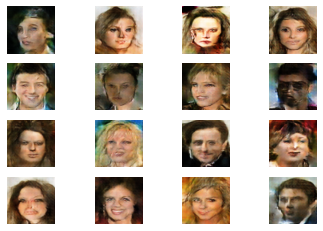



epoch -> [113/160], discriminator_loss_for_real_data = 37.71, discriminator_loss_for_fake_data = 28.78, generator_loss = 218.72



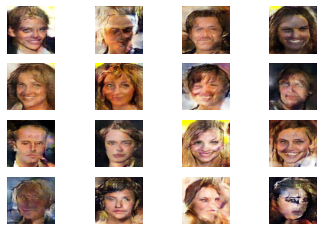



epoch -> [114/160], discriminator_loss_for_real_data = 37.65, discriminator_loss_for_fake_data = 29.33, generator_loss = 215.16



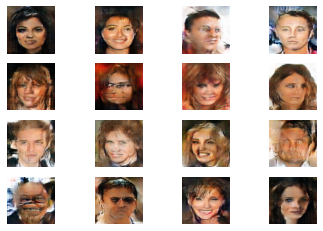



epoch -> [115/160], discriminator_loss_for_real_data = 38.20, discriminator_loss_for_fake_data = 29.46, generator_loss = 217.19



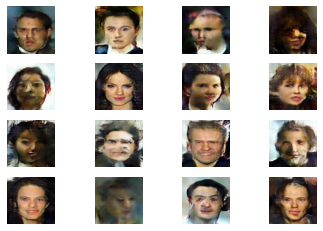



epoch -> [116/160], discriminator_loss_for_real_data = 36.44, discriminator_loss_for_fake_data = 27.89, generator_loss = 220.04



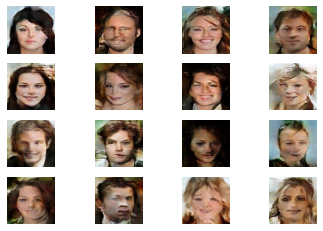



epoch -> [117/160], discriminator_loss_for_real_data = 37.08, discriminator_loss_for_fake_data = 29.96, generator_loss = 218.96



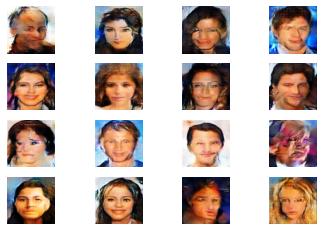



epoch -> [118/160], discriminator_loss_for_real_data = 37.23, discriminator_loss_for_fake_data = 28.93, generator_loss = 216.65



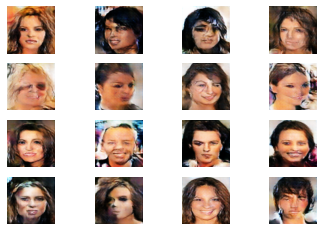



epoch -> [119/160], discriminator_loss_for_real_data = 37.65, discriminator_loss_for_fake_data = 28.92, generator_loss = 218.03



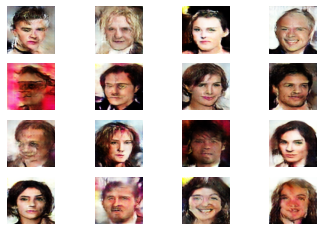



epoch -> [120/160], discriminator_loss_for_real_data = 37.02, discriminator_loss_for_fake_data = 29.32, generator_loss = 216.33



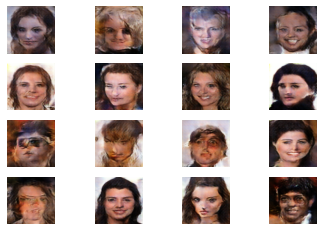



epoch -> [121/160], discriminator_loss_for_real_data = 35.74, discriminator_loss_for_fake_data = 27.21, generator_loss = 221.46



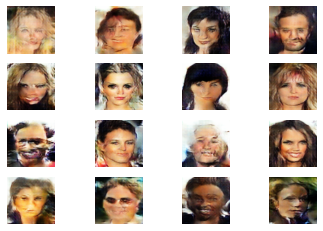



epoch -> [122/160], discriminator_loss_for_real_data = 36.66, discriminator_loss_for_fake_data = 28.23, generator_loss = 221.64



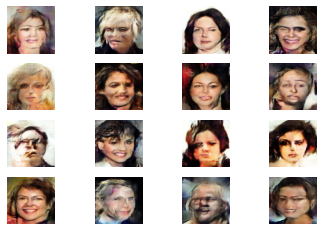



epoch -> [123/160], discriminator_loss_for_real_data = 35.86, discriminator_loss_for_fake_data = 29.02, generator_loss = 226.03



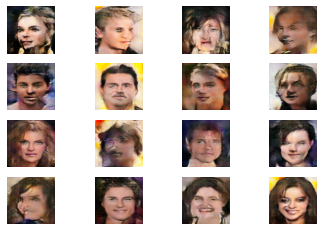



epoch -> [124/160], discriminator_loss_for_real_data = 36.38, discriminator_loss_for_fake_data = 27.74, generator_loss = 219.78



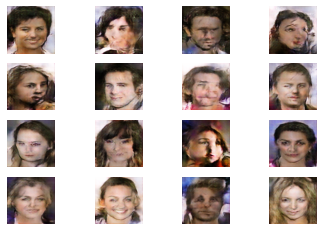



epoch -> [125/160], discriminator_loss_for_real_data = 36.24, discriminator_loss_for_fake_data = 27.44, generator_loss = 221.89



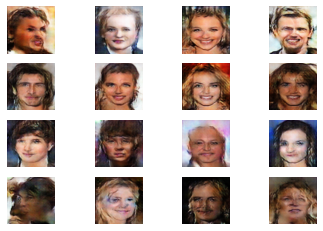



epoch -> [126/160], discriminator_loss_for_real_data = 36.30, discriminator_loss_for_fake_data = 28.03, generator_loss = 223.04



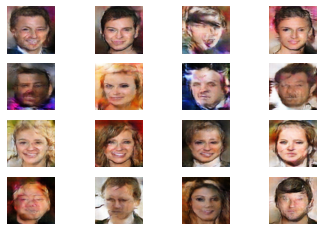



epoch -> [127/160], discriminator_loss_for_real_data = 36.38, discriminator_loss_for_fake_data = 28.06, generator_loss = 216.24



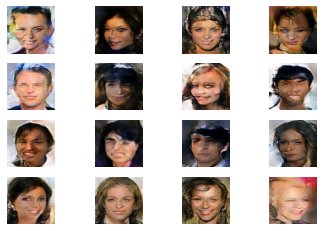



epoch -> [128/160], discriminator_loss_for_real_data = 35.94, discriminator_loss_for_fake_data = 27.81, generator_loss = 223.68



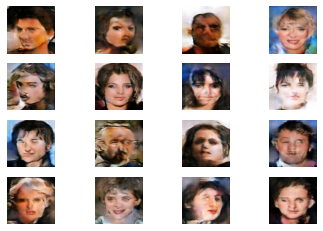



epoch -> [129/160], discriminator_loss_for_real_data = 36.13, discriminator_loss_for_fake_data = 27.62, generator_loss = 222.30



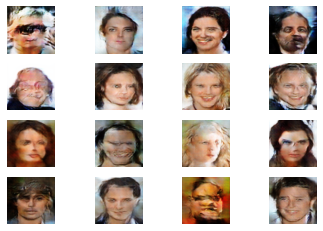



epoch -> [130/160], discriminator_loss_for_real_data = 35.62, discriminator_loss_for_fake_data = 27.96, generator_loss = 222.27



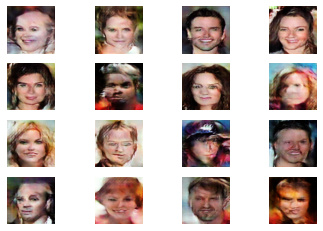



epoch -> [131/160], discriminator_loss_for_real_data = 35.86, discriminator_loss_for_fake_data = 27.96, generator_loss = 221.97



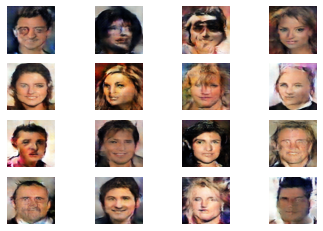



epoch -> [132/160], discriminator_loss_for_real_data = 35.52, discriminator_loss_for_fake_data = 26.49, generator_loss = 222.77



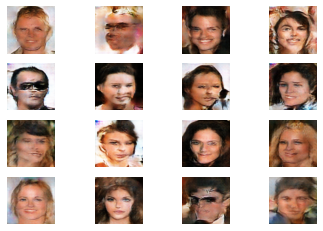

In [ ]:
with tf.device(device_name):

  latent_dim = 512
  n_epochs = 160
  n_batch = 32
  d_model = define_discriminator()
  g_model = define_generator(latent_dim)
  gan_model = define_gan(g_model, d_model)
  dataset = load_real_samples()
  print('\nREADY TO GO !!!\n')
  
  d_loss_real_array, d_loss_fake_array, g_loss_array = train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs, n_batch)

## Plot Loss Values

In [ ]:
# g_model.save("/content/sample_data/generator_model_c_dcgan.h5")

In [ ]:
# loaded = np.load('/content/drive/MyDrive/GAN_New_Approch/1/loss_record_2.npz')
# print(loaded['a'].shape)
# print(loaded['b'].shape)

In [5]:
loaded = np.load('/content/drive/MyDrive/GAN_New_Approch/1/loss_record_2.npz')
print(loaded['a'].shape)
print(loaded['b'].shape)
print(loaded['c'].shape)

(132,)
(132,)
(132,)


In [6]:
import matplotlib.pyplot as plot

d_loss_real_array = np.array(loaded['a'])
d_loss_fake_array = np.array(loaded['b'])

In [7]:
d_loss = np.array([(i+j) for i,j in zip(d_loss_real_array, d_loss_fake_array)])

In [8]:
g_loss = loaded['c']

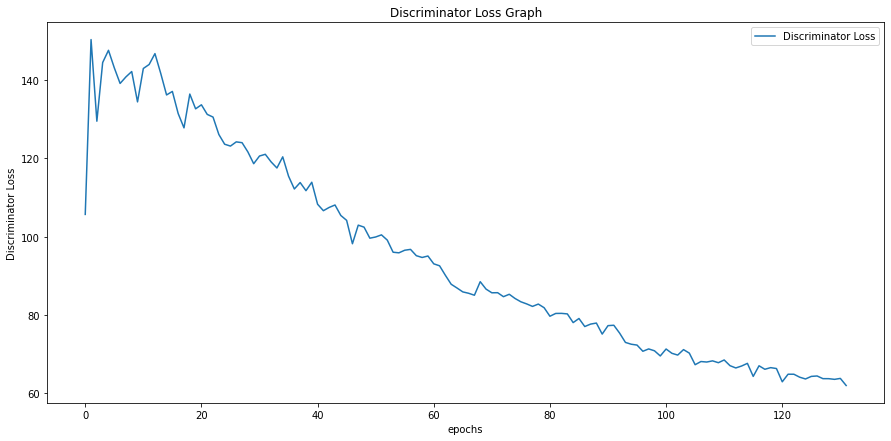

In [9]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.title('Discriminator Loss Graph')
plt.ylabel('Discriminator Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss"], loc='upper right')
plt.show()

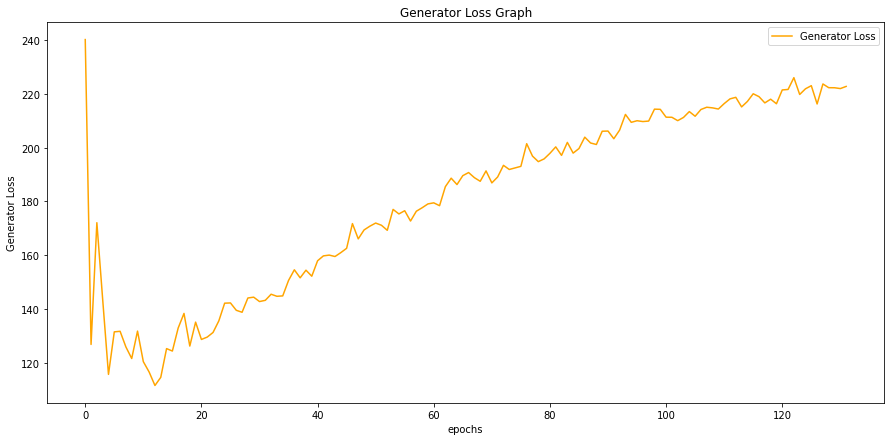

In [10]:
plt.figure(figsize=(15,7))
plt.plot(g_loss,color='orange')
plt.title('Generator Loss Graph')
plt.ylabel('Generator Loss')
plt.xlabel('epochs')
plt.legend(["Generator Loss"], loc='upper right')
plt.show()

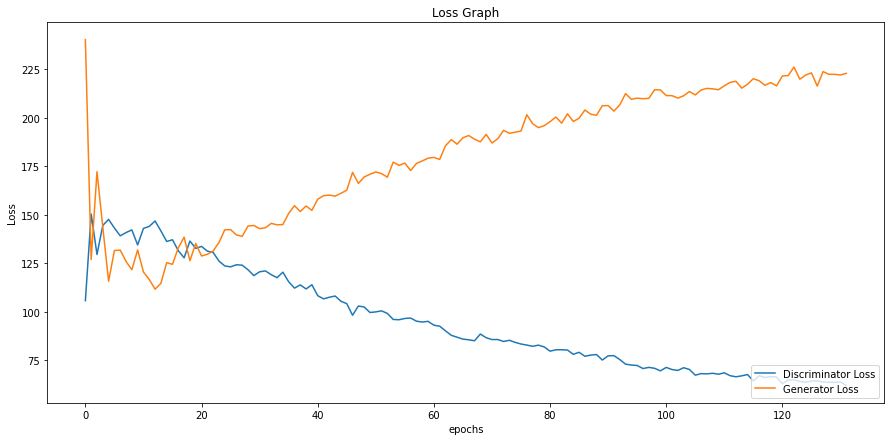

In [11]:
plt.figure(figsize=(15,7))
plt.plot(d_loss)
plt.plot(g_loss)
plt.title('Loss Graph')
plt.ylabel('Loss')
plt.xlabel('epochs')
plt.legend(["Discriminator Loss", "Generator Loss"], loc='lower right')
plt.show()

# Prediction

In [12]:
generator = tensorflow.keras.models.load_model("/content/drive/MyDrive/GAN_New_Approch/1/generator_model_2.h5")

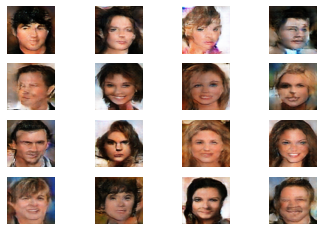

In [18]:
latent_dim = 512
n_samples = 16
z_input, labels = generate_latent_points(latent_dim, n_samples)
# print("latent points(latent points and labels): ",z_input.shape, labels.shape)
data = [z_input,labels]
pred = generator.predict(data)
pred = (pred +1 ) / 2.0
# print("\nGenerated images with labels: ",pred.shape,'\n')
save_plot(pred,n=4)

                                              -:END:-